In [ ]:
!git clone https://github.com/huggingface/diffusers
%pip install git+https://github.com/huggingface/diffusers
%pip install triton
%pip install accelerate transformers ftfy gradio natsort safetensors
%pip install bitsandbytes
%pip install peft

In [ ]:
import torch
from torch import autocast
from diffusers import StableDiffusionPipeline, DDIMScheduler,  StableDiffusionControlNetPipeline, UniPCMultistepScheduler, ControlNetModel
from diffusers.utils import load_image
from IPython.display import display
import torch
import os
from PIL import Image
import cv2
import numpy as np

from google.colab import drive
drive.mount('/content/drive')

#### Загрузим, конвертируем и сохраним модель на диск.

In [ ]:
!wget -O civitai_midel.ckpt "https://civitai.com/api/download/models/372799?type=Model&format=SafeTensor&size=pruned&fp=fp32&token=a91b3d9b268f498a0f7b31b769f82f98"
!wget https://raw.githubusercontent.com/CompVis/stable-diffusion/main/configs/stable-diffusion/v1-inference.yaml

In [ ]:
cache_dir = "/content/cache_dir/models"
os.makedirs(cache_dir, exist_ok=True)

In [ ]:
!python diffusers/scripts/convert_original_stable_diffusion_to_diffusers.py \
      --checkpoint_path='/content/civitai_midel.ckpt'\
      --original_config_file='/content/v1-inference.yaml'\
      --dump_path='/content/cache_dir/models/civitai_model'\
      --scheduler_type="ddim" --prediction_type='epsilon'\
      --from_safetensors

In [ ]:
!unzip /content/class_images.zip -d /content/class_images

In [ ]:
os.makedirs("/content/drive/MyDrive/shared/stable-diffusion-weights/CyberRealistic", exist_ok=True)
os.makedirs("/content/drive/MyDrive/shared/stable-diffusion-weights/Dreambooth/Exp_1", exist_ok=True)
os.makedirs("/content/drive/MyDrive/shared/images/class_images", exist_ok=True)
os.makedirs("/content/imgs_resized", exist_ok=True)

In [ ]:
!cp -r /content/cache_dir/models/civitai_model/ /content/drive/MyDrive/shared/stable-diffusion-weights/CyberRealistic

In [ ]:
!unzip /content/imgs_resized.zip -d /content/imgs_resized

In [ ]:
os.environ['INSTANCE_DIR'] = "/content/imgs_resized"
os.environ['CLASS_DIR'] = "/content/class_images/class_images"

os.environ['MODEL_NAME'] = "/content/drive/MyDrive/shared/stable-diffusion-weights/CyberRealistic/civitai_model"
os.environ['OUTPUT_DIR'] = "/content/drive/MyDrive/shared/stable-diffusion-weights/Dreambooth/Exp_1"

pretrained_sd = os.environ['MODEL_NAME']

In [ ]:
!python3 /content/diffusers/examples/dreambooth/train_dreambooth.py \
  --pretrained_model_name_or_path=$MODEL_NAME \
  --instance_data_dir=$INSTANCE_DIR \
  --class_data_dir=$CLASS_DIR \
  --output_dir=$OUTPUT_DIR \
  --instance_prompt="a photo of sks man face" \
  --class_prompt="a photo of man face" \
  --with_prior_preservation --prior_loss_weight=1.0 \
  --resolution=512 \
  --train_batch_size=1 \
  --learning_rate=2e-6 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --gradient_accumulation_steps=1 \
  --num_class_images=500 \
  --max_train_steps=500 \
  --checkpointing_steps=500 \
  --use_8bit_adam \
  --mixed_precision="no"\
  --train_text_encoder

In [ ]:
model_path = os.environ['OUTPUT_DIR']

pipe = StableDiffusionPipeline.from_pretrained(model_path, safety_checker=None, torch_dtype=torch.float16).to("cuda")
pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config)

In [ ]:
g_cuda = torch.Generator(device='cuda')
seed = 345252 #@param {type:"number"}
g_cuda.manual_seed(seed)

In [ ]:
prompt = "portrait of sks man face, on the street, lights, midnight, NY, standing, 4K, raw, hrd, hd, high quality, realism, sharp focus,  beautiful eyes, detailed eyes" #@param {type:"string"}
negative_prompt = "naked, nsfw, deformed, distorted, disfigured, poorly drawn, bad anatomy, extra limb, missing limb, floating limbs, mutated hands disconnected limbs, mutation, ugly, blurry, amputation" #@param {type:"string"}
num_samples = 2 #@param {type:"number"}
guidance_scale = 7.5 #@param {type:"number"}
num_inference_steps = 35 #@param {type:"number"}
height = 512 #@param {type:"number"}
width = 512 #@param {type:"number"}

with autocast("cuda"), torch.inference_mode():
    images = pipe(
        prompt,
        height=height,
        width=width,
        negative_prompt=negative_prompt,
        num_images_per_prompt=num_samples,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale,
        generator=g_cuda
    ).images


  0%|          | 0/35 [00:00<?, ?it/s]

In [ ]:
def get_concat_h(images):
    l = len(images)
    w, h = images[0].width, images[0].height
    dst = Image.new('RGB', (w * l, h))
    for i in range(len(images)):
      dst.paste(images[i], (w * i, 0))
    return dst

### Канье на улицах Нью-Йорка в 4К

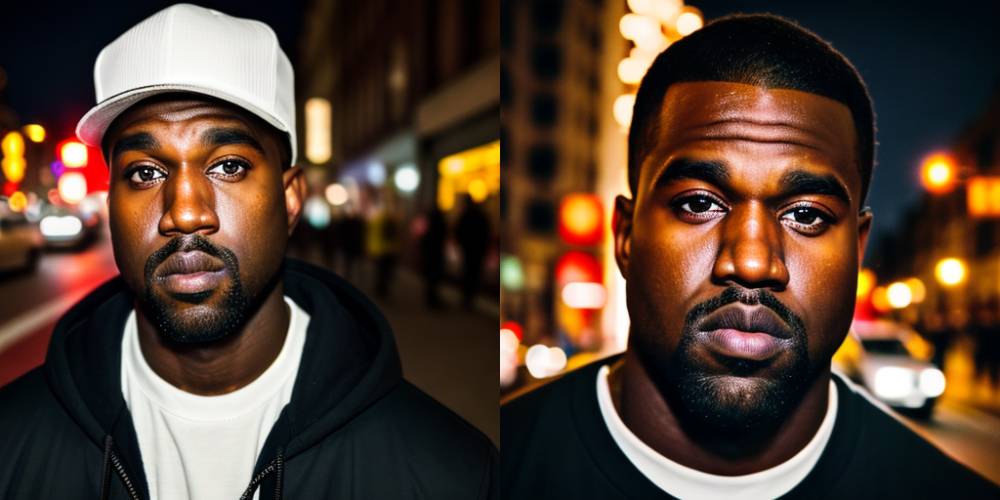

In [ ]:
img = get_concat_h(images)
display(img)

In [ ]:
custom_prompts = {
    "forest" : "portrait of sks man face, in the forest, sequoias, fresh air, nature, standing, 4K, raw, hrd, hd, high quality, realism, sharp focus,  beautiful eyes, detailed eyes",
    "desert" : "portrait of sks man face, in the desert, sand, scorching, hot, standing, 4K, raw, hrd, hd, high quality, realism, sharp focus,  beautiful eyes, detailed eyes",
    "beach" : "portrait of sks man face, on the beach, black sunglasses, palms, sea, standing, 4K, raw, hrd, hd, high quality, realism, sharp focus,  beautiful eyes, detailed eyes",
    "moon" : "portrait of sks man face, on the moon, space, astronaut, lunar, standing, 4K, raw, hrd, hd, high quality, realism, sharp focus,  beautiful eyes, detailed eyes",
    "pirate" : "portrait of sks man face, on the pirate ship, eye patch, pirate hat, ocean, standing, 4K, raw, hrd, hd, high quality, realism, sharp focus,  beautiful eyes, detailed eyes",
}

In [ ]:
custom_images = []

for v in custom_prompts.values():
  with autocast("cuda"), torch.inference_mode():
    images = pipe(
        v,
        height=height,
        width=width,
        negative_prompt=negative_prompt,
        num_images_per_prompt=1,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale,
        generator=g_cuda
    ).images
    custom_images.extend(images)

### Канье в лесу, в пустыне, на пляже, Луне, пират.

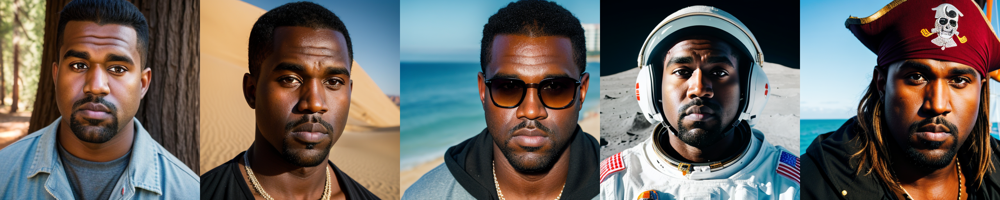

In [ ]:
display(get_concat_h(custom_images))

### LoRA

### Ranks in ``[4, 16, 64]``

In [ ]:
lora_rank_4_path = "/content/drive/MyDrive/shared/stable-diffusion-weights/LoRA/Rank_4"
lora_rank_16_path = "/content/drive/MyDrive/shared/stable-diffusion-weights/LoRA/Rank_16"
lora_rank_64_path = "/content/drive/MyDrive/shared/stable-diffusion-weights/LoRA/Rank_64"

os.makedirs(lora_rank_4_path, exist_ok=True)
os.makedirs(lora_rank_16_path, exist_ok=True)
os.makedirs(lora_rank_64_path, exist_ok=True)

os.environ['LoRA_RANK_4'] = lora_rank_4_path
os.environ['LoRA_RANK_16'] = lora_rank_16_path
os.environ['LoRA_RANK_64'] = lora_rank_64_path

### RANK 4

In [ ]:
!python3 /content/diffusers/examples/dreambooth/train_dreambooth_lora.py \
  --pretrained_model_name_or_path=$MODEL_NAME \
  --instance_data_dir=$INSTANCE_DIR \
  --class_data_dir=$CLASS_DIR \
  --output_dir=$LoRA_RANK_4 \
  --instance_prompt="a photo of sks man face" \
  --class_prompt="a photo of man face" \
  --with_prior_preservation --prior_loss_weight=1.0 \
  --resolution=512 \
  --train_batch_size=1 \
  --learning_rate=2e-4 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --gradient_accumulation_steps=1 \
  --num_class_images=500 \
  --max_train_steps=500 \
  --checkpointing_steps=500 \
  --use_8bit_adam \
  --mixed_precision="no"\
  --rank=4 \
  --train_text_encoder

In [ ]:
pipe_lora_4 = StableDiffusionPipeline.from_pretrained(pretrained_sd, safety_checker=None, torch_dtype=torch.float16).to("cuda")
pipe_lora_4.load_lora_weights(lora_rank_4_path)

In [ ]:
custom_images_lora_4 = []

for v in custom_prompts.values():
  with autocast("cuda"), torch.inference_mode():
    images = pipe_lora_4(
        v,
        height=height,
        width=width,
        negative_prompt=negative_prompt,
        num_images_per_prompt=1,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale,
        generator=g_cuda
    ).images
    custom_images_lora_4.extend(images)

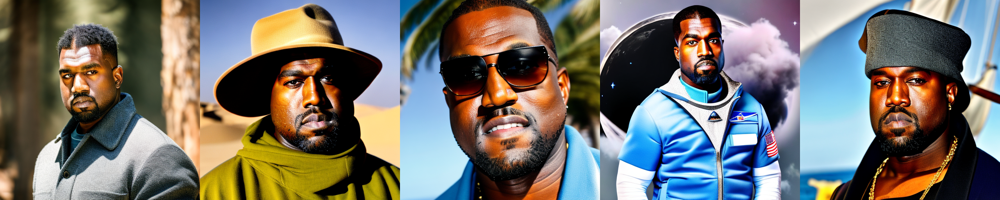

In [ ]:
display(get_concat_h(custom_images_lora_4))

### RANK 16

In [ ]:
!python3 /content/diffusers/examples/dreambooth/train_dreambooth_lora.py \
  --pretrained_model_name_or_path=$MODEL_NAME \
  --instance_data_dir=$INSTANCE_DIR \
  --class_data_dir=$CLASS_DIR \
  --output_dir=$LoRA_RANK_16 \
  --instance_prompt="a photo of sks man face" \
  --class_prompt="a photo of man face" \
  --with_prior_preservation --prior_loss_weight=1.0 \
  --resolution=512 \
  --train_batch_size=1 \
  --learning_rate=2e-4 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --gradient_accumulation_steps=1 \
  --num_class_images=500 \
  --max_train_steps=500 \
  --checkpointing_steps=500 \
  --use_8bit_adam \
  --mixed_precision="no"\
  --rank=16 \
  --train_text_encoder

In [ ]:
pipe_lora_16 = StableDiffusionPipeline.from_pretrained(pretrained_sd, safety_checker=None, torch_dtype=torch.float16).to("cuda")
pipe_lora_16.load_lora_weights(lora_rank_16_path)

In [ ]:
custom_images_lora_16 = []

for v in custom_prompts.values():
  with autocast("cuda"), torch.inference_mode():
    images = pipe_lora_16(
        v,
        height=height,
        width=width,
        negative_prompt=negative_prompt,
        num_images_per_prompt=1,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale,
        generator=g_cuda
    ).images
    custom_images_lora_16.extend(images)

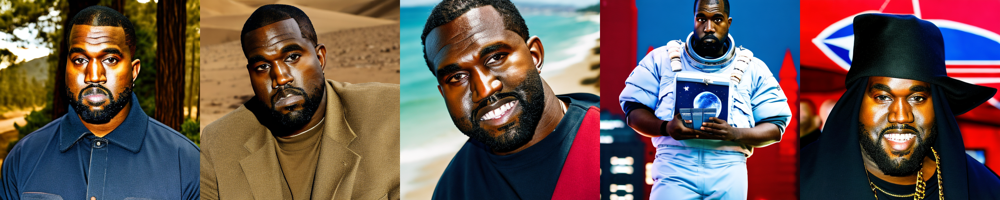

In [2]:
display(get_concat_h(custom_images_lora_16))

### RANK 64

In [ ]:
!python3 /content/diffusers/examples/dreambooth/train_dreambooth_lora.py \
  --pretrained_model_name_or_path=$MODEL_NAME \
  --instance_data_dir=$INSTANCE_DIR \
  --class_data_dir=$CLASS_DIR \
  --output_dir=$LoRA_RANK_64 \
  --instance_prompt="a photo of sks man face" \
  --class_prompt="a photo of man face" \
  --with_prior_preservation --prior_loss_weight=1.0 \
  --resolution=512 \
  --train_batch_size=1 \
  --learning_rate=2e-4 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --gradient_accumulation_steps=1 \
  --num_class_images=500 \
  --max_train_steps=500 \
  --checkpointing_steps=500 \
  --use_8bit_adam \
  --mixed_precision="no"\
  --rank=64 \
  --train_text_encoder

In [ ]:
pipe_lora_64 = StableDiffusionPipeline.from_pretrained(pretrained_sd, safety_checker=None, torch_dtype=torch.float16).to("cuda")
pipe_lora_64.load_lora_weights(lora_rank_64_path)

In [ ]:
custom_images_lora_64 = []

for v in custom_prompts.values():
  with autocast("cuda"), torch.inference_mode():
    images = pipe_lora_64(
        v,
        height=height,
        width=width,
        negative_prompt=negative_prompt,
        num_images_per_prompt=1,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale,
        generator=g_cuda
    ).images
    custom_images_lora_64.extend(images)

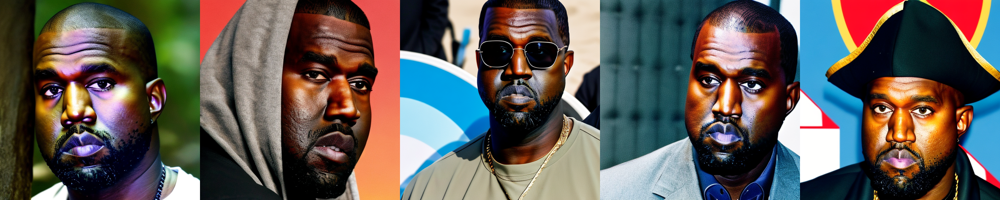

In [3]:
display(get_concat_h(custom_images_lora_64))

#### Визуально кажется, что при увеличении ```rank``` качество ухудшается, так как фон перестает соответствовать промпту, и на лице появляются нереалистичные цветовые эффекты.

### ControlNet

In [ ]:
image = load_image(
    "https://cs.pikabu.ru/post_img/2013/07/22/9/1374500157_593354219.jpg"
)

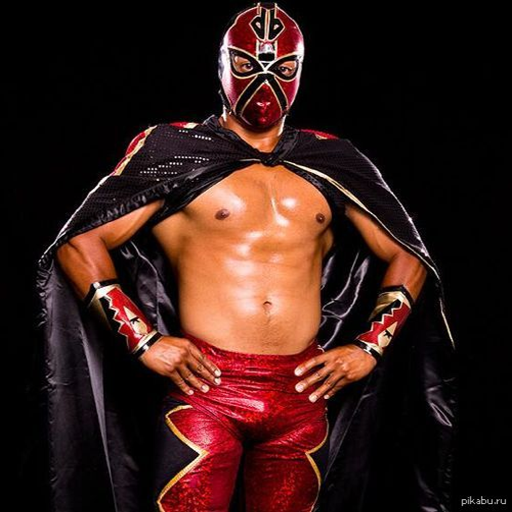

In [ ]:
size = (512, 512)
image = image.resize(size)
image

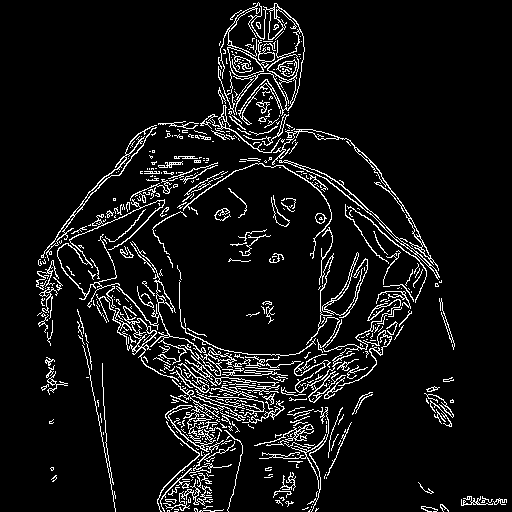

In [ ]:
image = np.array(image)

low_threshold = 100
high_threshold = 200

image = cv2.Canny(image, low_threshold, high_threshold)
image = image[:, :, None]
image = np.concatenate([image, image, image], axis=2)
canny_image = Image.fromarray(image)
canny_image

### ControlNet + Unet

In [ ]:
controlnet = ControlNetModel.from_pretrained("lllyasviel/sd-controlnet-canny",
                                             torch_dtype=torch.float16).to("cuda")

pipe_control_net = StableDiffusionControlNetPipeline.from_pretrained(
    model_path,
    controlnet=controlnet,
    torch_dtype=torch.float16).to("cuda")

pipe_control_net.scheduler = UniPCMultistepScheduler.from_config(pipe_control_net.scheduler.config)

In [ ]:
custom_images_control_unet = []

for v in custom_prompts.values():
  with autocast("cuda"), torch.inference_mode():
    images = pipe_control_net(
        v,
        canny_image,
        height=height,
        width=width,
        negative_prompt=negative_prompt,
        num_images_per_prompt=1,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale,
        generator=g_cuda
    ).images
    custom_images_control_unet.extend(images)

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

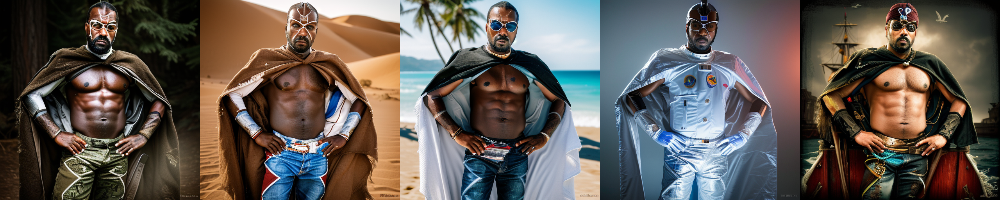

In [ ]:
display(get_concat_h(custom_images_control_unet))

### ControlNet + LoRA

In [ ]:
pipe_control_lora = StableDiffusionControlNetPipeline.from_pretrained(
    pretrained_sd,
    controlnet=controlnet,
    torch_dtype=torch.float16).to("cuda")

pipe_control_lora.scheduler = UniPCMultistepScheduler.from_config(pipe_control_lora.scheduler.config)
pipe_control_lora.load_lora_weights(lora_rank_4_path)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
custom_images_control_lora = []

for v in custom_prompts.values():
  with autocast("cuda"), torch.inference_mode():
    images = pipe_control_lora(
        v,
        canny_image,
        height=height,
        width=width,
        negative_prompt=negative_prompt,
        num_images_per_prompt=1,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale,
        generator=g_cuda
    ).images
    custom_images_control_lora.extend(images)

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

  0%|          | 0/35 [00:00<?, ?it/s]

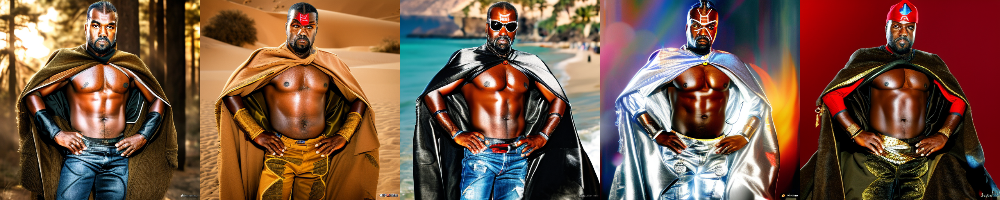

In [ ]:
display(get_concat_h(custom_images_control_lora))

Кажется, что связка ControlNet + Unet справилась лучше, так как опять таки качественее сгенерирован задний план и одежда. Особенно это заметно для изображений в стиле "на луне" и "пират".